In [1]:
from pathlib import Path
import pydicom
import numpy as np
import cv2
import pandas as pd
from tqdm.notebook import tqdm
import tensorflow as tf
import matplotlib.pyplot as plt

In [2]:
labels = pd.read_csv('datasets/RSNA-Pneumonia-Detection-Challenge/rsna_heart_detection.csv')
labels.head()

,label,x0,y0,w,h,name,img_shape_x,img_shape_y
0,heart,91,71,77,102,ca112a3c-b701-48b8-a94f-725ea65416a7,224,224
1,heart,70,64,89,67,e5f292ae-f1e5-497c-b0a0-68f1aa2196b2,224,224
2,heart,82,55,81,76,67af68f7-7ba0-49a0-a373-3a8801eb0faa,224,224
3,heart,93,74,78,89,814289a3-9ce8-4cba-842f-45d6a36f540d,224,224
4,heart,85,61,85,93,e508969f-c931-462b-aa90-ccde34a4d9e5,224,224


In [3]:
root_path = Path('datasets/RSNA-Pneumonia-Detection-Challenge/stage_2_train_images')

In [4]:
import imgaug
from imgaug.augmentables.bbs import BoundingBox
import imgaug.augmenters as iaa

In [5]:
def augmentation(image,x1,y1,x2,y2):
    seq = iaa.Sequential([
            iaa.GammaContrast(),
            iaa.Affine(scale=(0.8, 1.2),rotate=(-5, 5),translate_px=(-5, 5))
    ])
    bb = BoundingBox(x1=x1, y1=y1, x2=x2, y2=y2)
    new_img, aug_bbox  = seq.augment(image=image, bounding_boxes=bb)
    new_bbox = aug_bbox[0][0], aug_bbox[0][1], aug_bbox[1][0], aug_bbox[1][1]
    
    return new_img,new_bbox

# TF Record
def image_feature(image):
    img = tf.io.encode_png(image).numpy()
    img = tf.train.Feature(
            bytes_list = tf.train.BytesList(value=[img],)
    )
    return img

def label_feature(value):
    """Returns an int64_list from a bool / enum / int / uint."""
    label = tf.train.Feature(
        int64_list=tf.train.Int64List(value=value)
    )
    return label

def create_example(image,label):
    feature = {
        'image':image_feature(image),
        'label':label_feature(label)
    }
    record = tf.train.Example(features=tf.train.Features(feature=feature))
    return record

### Training Set

  0%|          | 0/400 [00:00<?, ?it/s]

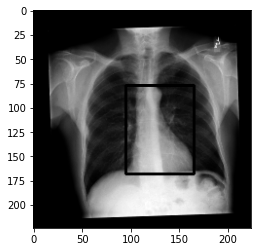

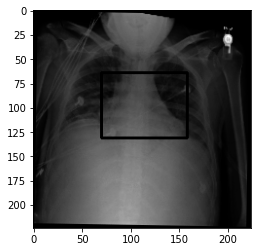

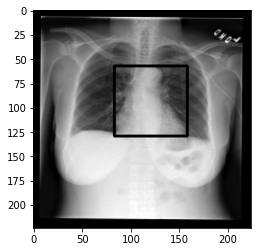

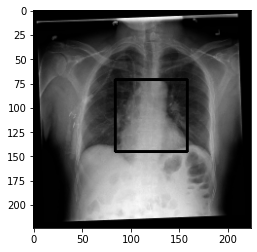

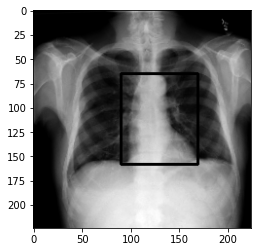

...

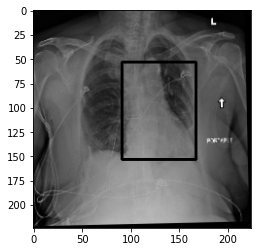

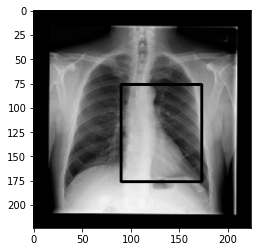

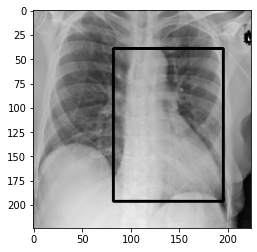

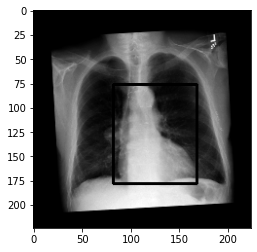

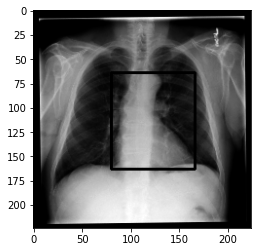

275

In [6]:
tfrecords_dir = "datasets/RSNA-Pneumonia-Detection-Challenge/Processed_Heart"
augmentation_cnt = 0
with tf.io.TFRecordWriter(tfrecords_dir + f'/train_file.tfrec') as writer:
    np.random.seed(100)
    for c,patient in enumerate(tqdm(list(labels.name)[:400])):
      
        # Training set
        dcm_path = root_path / patient
        dcm_path = dcm_path.with_suffix('.dcm')

        # Image and resize
        dcm = pydicom.read_file(dcm_path)
        image = dcm.pixel_array # 1024 x 1024
        image = cv2.resize(image,(224,224))
        image = image.reshape((224,224,1))
        image_copy = image.copy()

        # Get bounding box
        boundingbox = labels[labels['name']==patient][['x0','y0','w','h']].to_numpy().ravel()
        x1 = boundingbox[0]
        y1 = boundingbox[1]
        x2 = x1 + boundingbox[2]
        y2 = y1 + boundingbox[3]


        # Image for tfrecord
        tf_image = tf.cast(image,dtype=tf.uint8)
        # Label for tfrecord
        tf_label = tf.cast([x1,y1,x2,y2],dtype=tf.int64)

        # tf-record
        sample = create_example(tf_image,tf_label)
        writer.write(sample.SerializeToString())


        if np.random.random() > 0.3:
            new_img,new_bbox = augmentation(image_copy,x1,y1,x2,y2)
            x1,y1,x2,y2 = new_bbox
            x1 = int(x1)
            y1 = int(y1)
            x2 = int(x2)
            y2 = int(y2)

            
            # Plot Augmentated Image with bbox
            aug_img = new_img.copy()
            cv2.rectangle(aug_img, (x1,y1), (x2,y2),color=(0,255,0),thickness=2)
            plt.imshow(aug_img,cmap='gray')
            plt.show()
            
            # Image for tfrecord
            tf_image = tf.cast(new_img,dtype=tf.uint8)
            # Label for tfrecord
            tf_label = tf.cast([x1,y1,x2,y2],dtype=tf.int64)

            # tf-record
            sample = create_example(tf_image,tf_label)
            writer.write(sample.SerializeToString())
            augmentation_cnt += 1

augmentation_cnt

### Test Set

In [7]:
tfrecords_dir = "datasets/RSNA-Pneumonia-Detection-Challenge/Processed_Heart"
with tf.io.TFRecordWriter(tfrecords_dir + f'/valid_file.tfrec') as writer:
    for c,patient in enumerate(tqdm(list(labels.name)[400:])):
      
        # Training set
        dcm_path = root_path / patient
        dcm_path = dcm_path.with_suffix('.dcm')

        # Image and resize
        dcm = pydicom.read_file(dcm_path)
        image = dcm.pixel_array # 1024 x 1024
        image = cv2.resize(image,(224,224))
        image = image.reshape((224,224,1))
        image_copy = image.copy()

        # Get bounding box
        boundingbox = labels[labels['name']==patient][['x0','y0','w','h']].to_numpy().ravel()
        x1 = boundingbox[0]
        y1 = boundingbox[1]
        x2 = x1 + boundingbox[2]
        y2 = y1 + boundingbox[3]


        # Image for tfrecord
        tf_image = tf.cast(image,dtype=tf.uint8)
        # Label for tfrecord
        tf_label = tf.cast([x1,y1,x2,y2],dtype=tf.int64)

        # tf-record
        sample = create_example(tf_image,tf_label)
        writer.write(sample.SerializeToString())

  0%|          | 0/96 [00:00<?, ?it/s]